<a href="https://colab.research.google.com/github/vanssea/PCVK-_Ganjil-2025/blob/main/Week11_Vanessa_Cristin_Natalia.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Praktikum D1

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

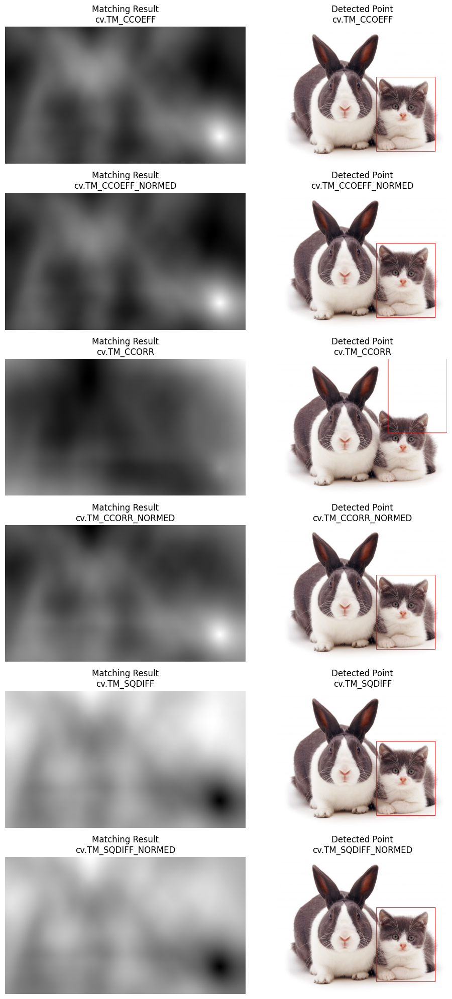

In [ ]:
img_path = '/content/drive/MyDrive/PCVK/cats_and_bunnies.jpg'
template_path = '/content/drive/MyDrive/PCVK/cat2_templatejpg.jpg'

img_rgb = cv.imread(img_path)
img_gray = cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)
template = cv.imread(template_path, 0)

# Check if the template image was loaded successfully
if template is None:
    print(f"Error: Could not load template image from {template_path}. Please check the path and file existence.")
else:
    w, h = template.shape[::-1]

    methods = [
        'cv.TM_CCOEFF',
        'cv.TM_CCOEFF_NORMED',
        'cv.TM_CCORR',
        'cv.TM_CCORR_NORMED',
        'cv.TM_SQDIFF',
        'cv.TM_SQDIFF_NORMED'
    ]

    plt.figure(figsize=(10, 20))

    for i, meth in enumerate(methods):
        img = img_gray.copy()
        method = eval(meth)

        res = cv.matchTemplate(img, template, method)
        min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)

        # Tentukan titik terbaik (min atau max)
        if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
            top_left = min_loc
        else:
            top_left = max_loc

        bottom_right = (top_left[0] + w, top_left[1] + h)

        detected_img = img_rgb.copy()
        cv.rectangle(detected_img, top_left, bottom_right, (0, 0, 255), 2)

        plt.subplot(6, 2, 2*i + 1)
        plt.imshow(res, cmap='gray')
        plt.title(f'Matching Result\n{meth}')
        plt.axis('off')

        plt.subplot(6, 2, 2*i + 2)
        plt.imshow(cv.cvtColor(detected_img, cv.COLOR_BGR2RGB))
        plt.title(f'Detected Point\n{meth}')
        plt.axis('off')

    plt.tight_layout()
    plt.show()


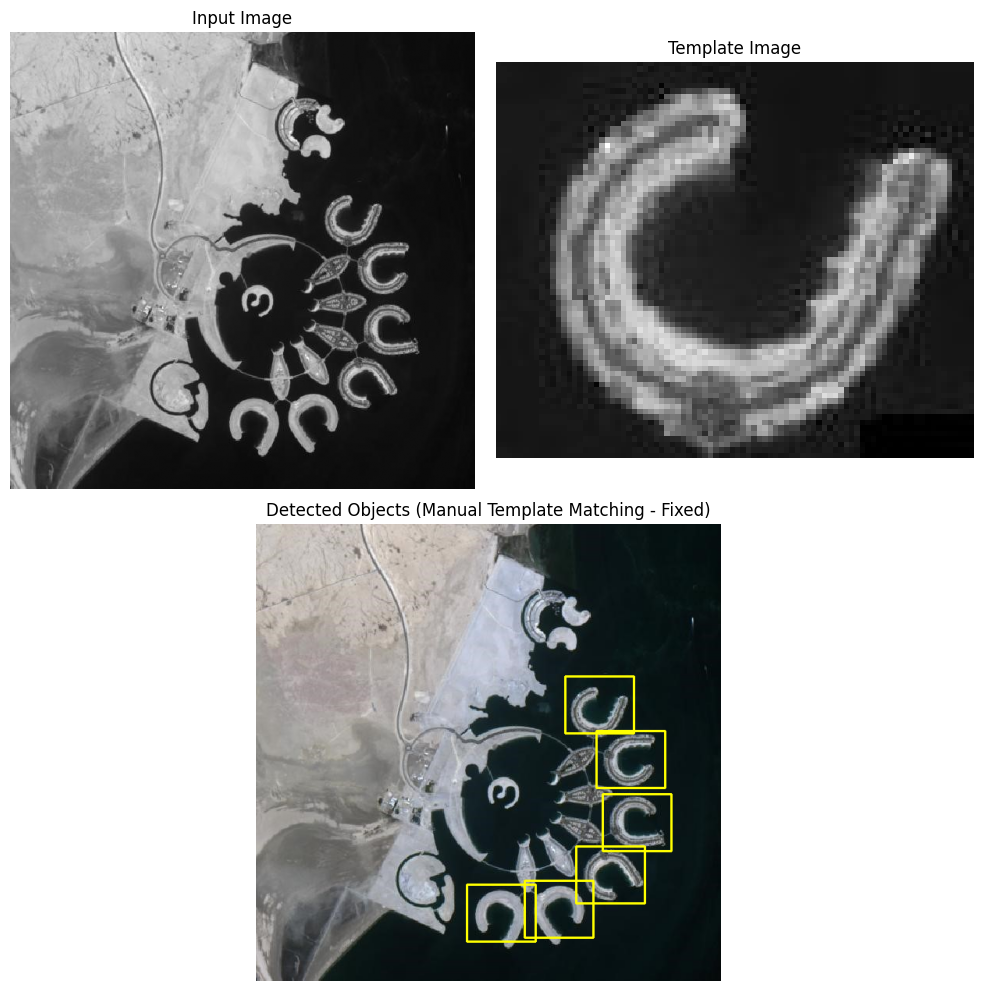

In [ ]:
from scipy.signal import correlate2d

img_path = '/content/drive/MyDrive/PCVK/bahrain.jpg'
template_path = '/content/drive/MyDrive/PCVK/bahrain-template.jpg'

img_rgb = cv.imread(img_path)
img_gray = cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)
template = cv.imread(template_path, 0)
h, w = template.shape

img_float = (img_gray - np.mean(img_gray)) / (np.std(img_gray) + 1e-6)
template_float = (template - np.mean(template)) / (np.std(template) + 1e-6)

corr = correlate2d(img_float, template_float, mode='valid')

corr_norm = (corr - np.min(corr)) / (np.max(corr) - np.min(corr))

threshold = 0.69
loc = np.where(corr_norm >= threshold)

detected_points = []
min_distance = int(min(h, w) * 0.5)

for (y, x) in zip(*loc):
    too_close = False
    for (py, px) in detected_points:
        if abs(x - px) < min_distance and abs(y - py) < min_distance:
            too_close = True
            break
    if not too_close:
        detected_points.append((y, x))

for (y, x) in detected_points:
    cv.rectangle(img_rgb, (x, y), (x + w, y + h), (0, 255, 255), 2)

plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.imshow(img_gray, cmap='gray')
plt.title('Input Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(template, cmap='gray')
plt.title('Template Image')
plt.axis('off')

plt.subplot(2, 1, 2)
plt.imshow(cv.cvtColor(img_rgb, cv.COLOR_BGR2RGB))
plt.title('Detected Objects (Manual Template Matching - Fixed)')
plt.axis('off')

plt.tight_layout()
plt.show()

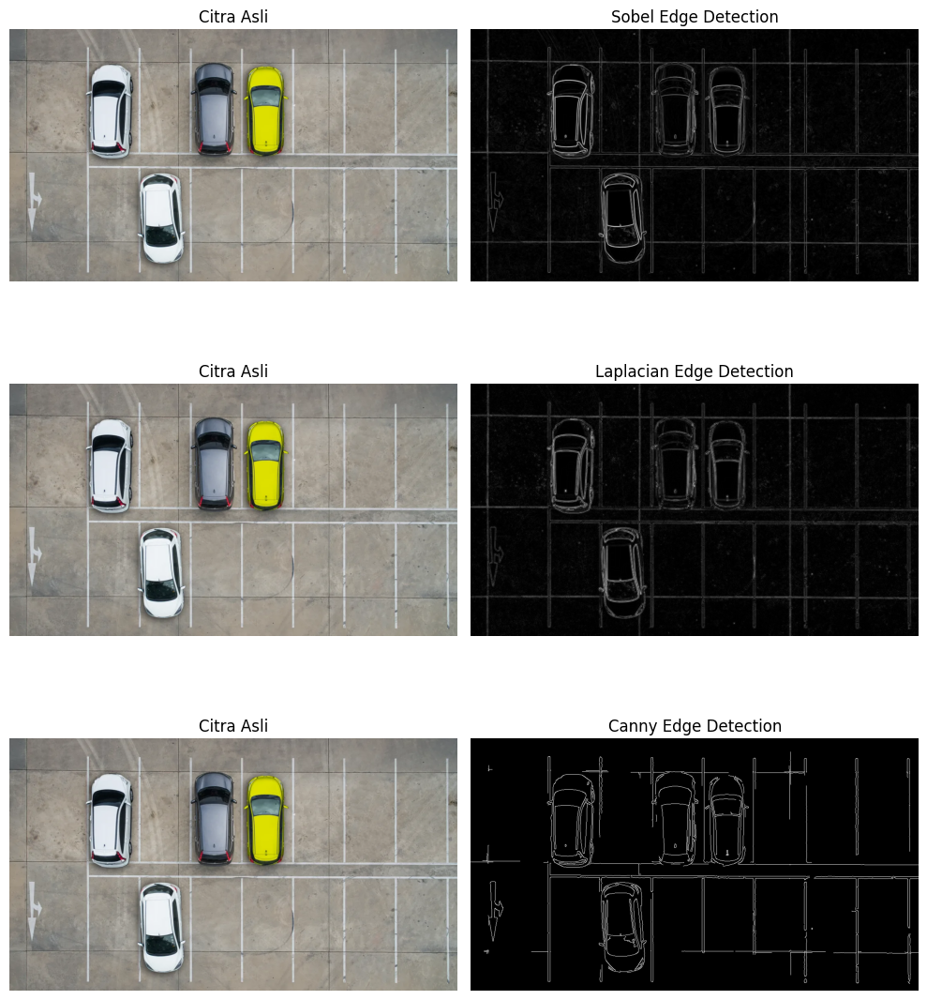

In [ ]:
img_path = '/content/drive/MyDrive/PCVK/car-park.jpg'
img = cv.imread(img_path)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# 1. SOBEL EDGE DETECTION
# Filter Sobel menghitung gradien arah X dan Y
sobelx = cv.Sobel(gray, cv.CV_64F, 1, 0, ksize=3)  # horizontal
sobely = cv.Sobel(gray, cv.CV_64F, 0, 1, ksize=3)  # vertikal
sobel_combined = cv.magnitude(sobelx, sobely)      # gabungkan

# 2. LAPLACIAN EDGE DETECTION
# Haluskan dulu dengan Gaussian filter agar noise berkurang
blurred = cv.GaussianBlur(gray, (3, 3), 0)
laplacian = cv.Laplacian(blurred, cv.CV_64F, ksize=3)
laplacian_abs = np.absolute(laplacian)

# 3. CANNY EDGE DETECTION
# Langkah-langkah: Gaussian blur → Canny
canny_blur = cv.GaussianBlur(gray, (5, 5), 1)
canny = cv.Canny(canny_blur, 100, 200)

plt.figure(figsize=(10, 12))

# ---- 1. Sobel ----
plt.subplot(3, 2, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Citra Asli')
plt.axis('off')

plt.subplot(3, 2, 2)
plt.imshow(sobel_combined, cmap='gray')
plt.title('Sobel Edge Detection')
plt.axis('off')

# ---- 2. Laplacian ----
plt.subplot(3, 2, 3)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Citra Asli')
plt.axis('off')

plt.subplot(3, 2, 4)
plt.imshow(laplacian_abs, cmap='gray')
plt.title('Laplacian Edge Detection')
plt.axis('off')

# ---- 3. Canny ----
plt.subplot(3, 2, 5)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Citra Asli')
plt.axis('off')

plt.subplot(3, 2, 6)
plt.imshow(canny, cmap='gray')
plt.title('Canny Edge Detection')
plt.axis('off')

plt.tight_layout()
plt.show()


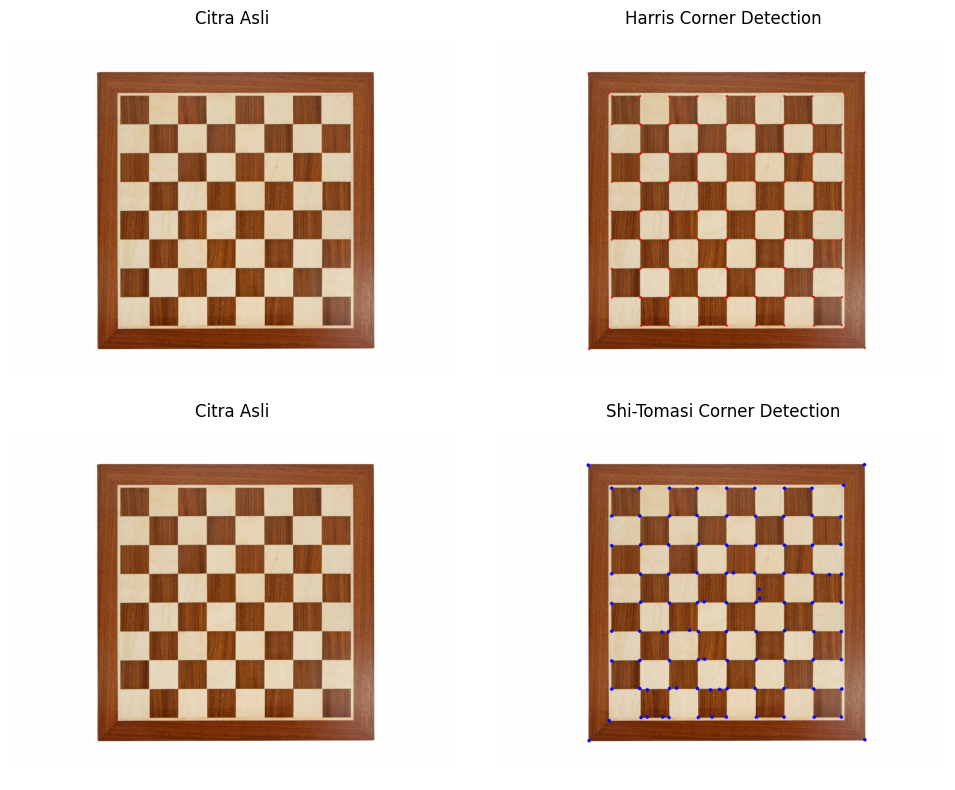

In [ ]:
img_path = '/content/drive/MyDrive/PCVK/chess-board.jpg'

img = cv.imread(img_path)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
gray = np.float32(gray)  # konversi ke float32 untuk Harris

# 1. HARRIS CORNER DETECTION
harris_dst = cv.cornerHarris(gray, blockSize=2, ksize=3, k=0.04)

harris_dst = cv.dilate(harris_dst, None)

harris_img = img.copy()
harris_img[harris_dst > 0.01 * harris_dst.max()] = [0, 0, 255]

# 2. SHI-TOMASI CORNER DETECTION
shi_img = img.copy()
corners = cv.goodFeaturesToTrack(
    np.uint8(gray),
    maxCorners=100,
    qualityLevel=0.01,
    minDistance=10
)
corners = corners.astype(int)

for i in corners:
    x, y = i.ravel()
    cv.circle(shi_img, (x, y), 4, (255, 0, 0), -1)


plt.figure(figsize=(10, 8))

plt.subplot(2, 2, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Citra Asli')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(cv.cvtColor(harris_img, cv.COLOR_BGR2RGB))
plt.title('Harris Corner Detection')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Citra Asli')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(cv.cvtColor(shi_img, cv.COLOR_BGR2RGB))
plt.title('Shi-Tomasi Corner Detection')
plt.axis('off')

plt.tight_layout()
plt.show()

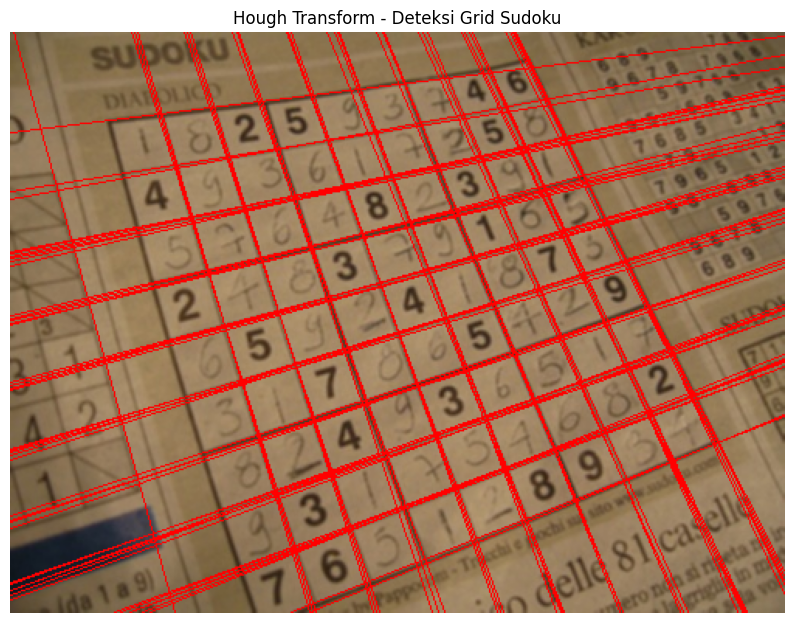

In [ ]:
import cv2

img = cv2.imread('/content/drive/MyDrive/PCVK/sudoku.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 1. Canny edge detection
edges = cv2.Canny(gray, 40, 180, apertureSize=3)

# 2. Hough Transform untuk deteksi garis
lines = cv2.HoughLines(edges, 1, np.pi / 360, 155)

for line in lines:
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))
    cv2.line(img, (x1, y1), (x2, y2), (0, 0, 255), 1)

# 5. Tampilkan hasil
plt.figure(figsize=(10, 8))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Hough Transform - Deteksi Grid Sudoku')
plt.axis('off')
plt.show()


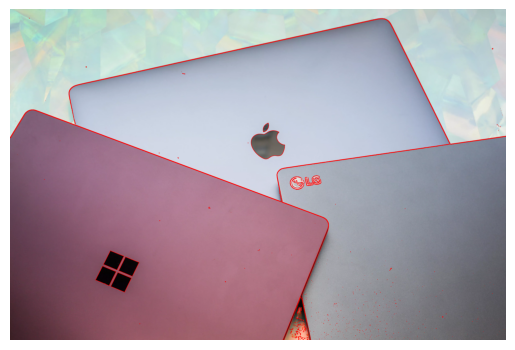

In [ ]:
import cv2

img = cv2.imread('/content/drive/MyDrive/PCVK/laptop.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

blur = cv2.GaussianBlur(gray, (11, 11), 0)

thresh = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                               cv2.THRESH_BINARY_INV, 9, 2)

kernel = np.ones((3, 3), np.uint8)
morph = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=2)

contours, hierarchy = cv2.findContours(morph, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

img_contour = img.copy()
cv2.drawContours(img_contour, contours, -1, (0, 0, 255), 2)

plt.imshow(cv2.cvtColor(img_contour, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


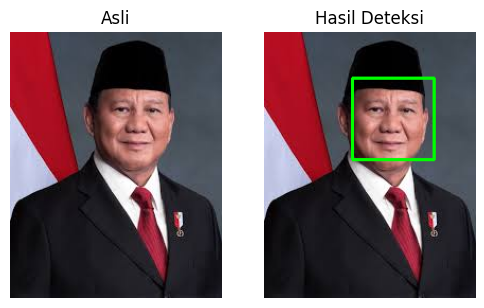

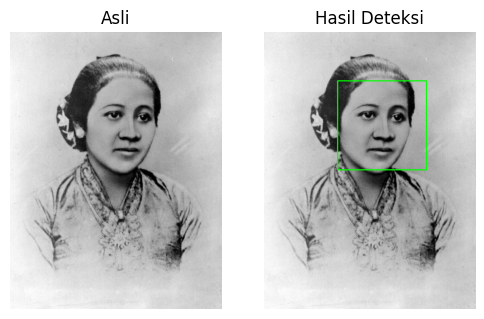

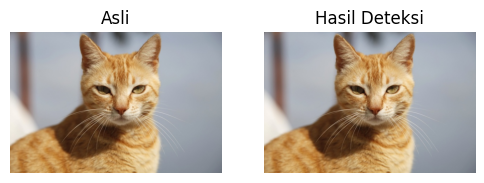

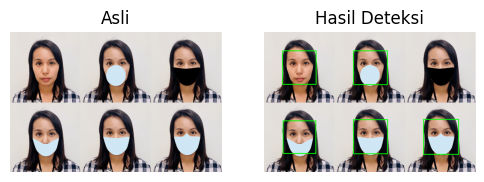

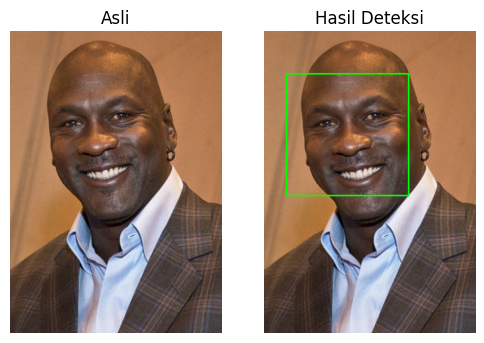

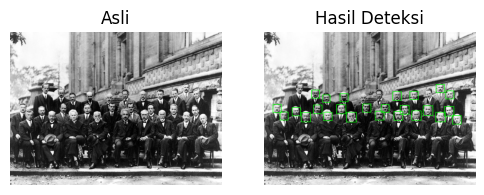

In [ ]:
import cv2 as cv

cascade_path = '/content/drive/MyDrive/PCVK/haarcascade_frontalface_alt.xml'

gambar_list = [
    '/content/drive/MyDrive/PCVK/prabowo.jpg',
    '/content/drive/MyDrive/PCVK/kartini.jpg',
    '/content/drive/MyDrive/PCVK/mycat.jpg',
    '/content/drive/MyDrive/PCVK/mask.png',
    '/content/drive/MyDrive/PCVK/mjordan.jpg',
    '/content/drive/MyDrive/PCVK/solvayconf.jpg'
]

def tampilkan_deteksi(path_gambar, cascade_path):
    img_color = cv.imread(path_gambar)
    img_gray = cv.cvtColor(img_color, cv.COLOR_BGR2GRAY)

    face_cascade = cv.CascadeClassifier(cascade_path)

    faces = face_cascade.detectMultiScale(
        img_gray,
        scaleFactor=1.1,
        minNeighbors=5,
        minSize=(30, 30)
    )

    hasil = img_color.copy()
    for (x, y, w, h) in faces:
        cv.rectangle(hasil, (x, y), (x + w, y + h), (0, 255, 0), 2)

    plt.figure(figsize=(6, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(cv.cvtColor(img_color, cv.COLOR_BGR2RGB))
    plt.title("Asli")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(cv.cvtColor(hasil, cv.COLOR_BGR2RGB))
    plt.title("Hasil Deteksi")
    plt.axis("off")

    plt.show()

# --- Jalankan deteksi untuk tiap gambar ---
for path in gambar_list:
    tampilkan_deteksi(path, cascade_path)

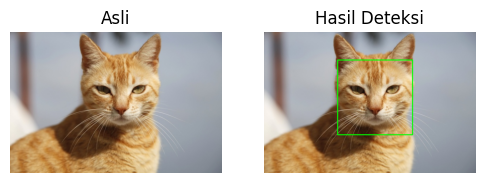

In [ ]:
import cv2 as cv

cascade_kucing = '/content/drive/MyDrive/PCVK/haarcascade_frontalcatface_extended.xml'

gambar_kucing = [
    '/content/drive/MyDrive/PCVK/mycat.jpg',
]

def tampilkan_deteksi(gambar_kucing, cascade_kucing):
    img_color = cv.imread(gambar_kucing)
    img_gray = cv.cvtColor(img_color, cv.COLOR_BGR2GRAY)

    face_cascade = cv.CascadeClassifier(cascade_kucing)

    faces = face_cascade.detectMultiScale(
        img_gray,
        scaleFactor=1.1,
        minNeighbors=5,
        minSize=(30, 30)
    )

    hasil = img_color.copy()
    for (x, y, w, h) in faces:
        cv.rectangle(hasil, (x, y), (x + w, y + h), (0, 255, 0), 2)

    plt.figure(figsize=(6, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(cv.cvtColor(img_color, cv.COLOR_BGR2RGB))
    plt.title("Asli")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(cv.cvtColor(hasil, cv.COLOR_BGR2RGB))
    plt.title("Hasil Deteksi")
    plt.axis("off")

    plt.show()

for path in gambar_kucing:
    tampilkan_deteksi(path, cascade_kucing)


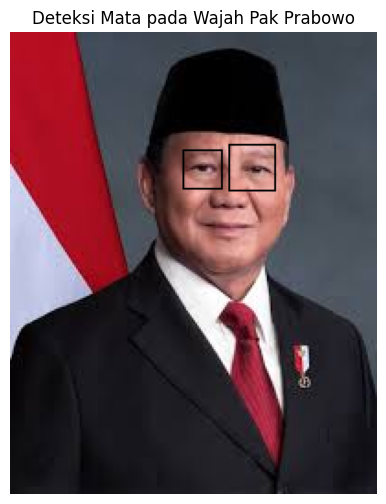

In [ ]:
import cv2 as cv
import matplotlib.pyplot as plt

gambar = '/content/drive/MyDrive/PCVK/prabowo.jpg'
eye_cascade_path = cv.data.haarcascades + 'haarcascade_eye.xml'

# Membaca gambar dan ubah ke grayscale
img = cv.imread(gambar)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Load Haar Cascade untuk deteksi mata
eye_cascade = cv.CascadeClassifier(eye_cascade_path)

# Lakukan deteksi mata
eyes = eye_cascade.detectMultiScale(
    gray,
    scaleFactor=1.05,
    minNeighbors=5,
    minSize=(20, 20)
)

# Gambar kotak di sekitar area mata yang terdeteksi
detected_img = img.copy()
for (x, y, w, h) in eyes:
    cv.rectangle(detected_img, (x, y), (x + w, y + h), (0, 0, 0), 1)

# Tampilkan hasil
plt.figure(figsize=(6, 6))
plt.imshow(cv.cvtColor(detected_img, cv.COLOR_BGR2RGB))
plt.title("Deteksi Mata pada Wajah Pak Prabowo")
plt.axis("off")
plt.show()

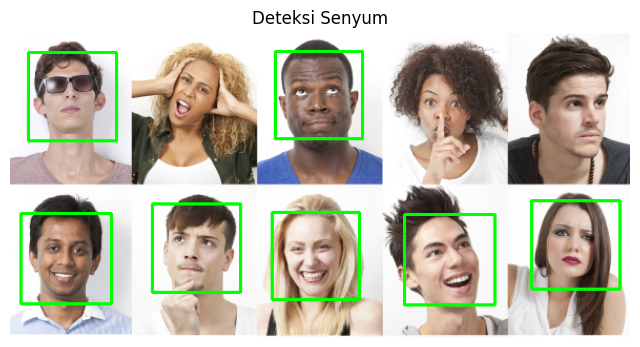

In [ ]:
import cv2 as cv
import matplotlib.pyplot as plt

gambar = '/content/drive/MyDrive/PCVK/people.jpg'
cascade_wajah = '/content/drive/MyDrive/PCVK/haarcascade_frontalface_default.xml'
cascade_senyum = '/content/drive/MyDrive/PCVK/haarcascade_smile.xml'

def deteksi_senyum(gambar, cascade_wajah, cascade_senyum):
    img_color = cv.imread(gambar)
    img_gray = cv.cvtColor(img_color, cv.COLOR_BGR2GRAY)

    face_cascade = cv.CascadeClassifier(cascade_wajah)
    smile_cascade = cv.CascadeClassifier(cascade_senyum)

    # Deteksi wajah
    faces = face_cascade.detectMultiScale(
        img_gray,
        scaleFactor=1.1,
        minNeighbors=5,
        minSize=(80, 80)
    )

    hasil = img_color.copy()

    for (x, y, w, h) in faces:
        cv.rectangle(hasil, (x, y), (x + w, y + h), (0, 255, 0), 2)
        roi_gray = img_gray[y:y + h, x:x + w]
        roi_color = hasil[y:y + h, x:x + w]

        # Deteksi senyum dalam area wajah
        smiles = smile_cascade.detectMultiScale(
            roi_gray,
            scaleFactor=1.7,
            minNeighbors=20,
            minSize=(25, 25)
        )

        for (sx, sy, sw, sh) in smiles:
            cv.rectangle(roi_color, (sx, sy), (sx + sw, sy + sh), (255, 255, 255), 2)

    plt.figure(figsize=(8, 8))
    plt.imshow(cv.cvtColor(hasil, cv.COLOR_BGR2RGB))
    plt.title("Deteksi Senyum")
    plt.axis("off")
    plt.show()

deteksi_senyum(gambar, cascade_wajah, cascade_senyum)


<IPython.core.display.Javascript object>

>>> START: Klik Allow kamera, klik '📸 Capture' untuk ambil foto, klik video untuk berhenti.


/tmp/ipython-input-1950955069.py:23: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')


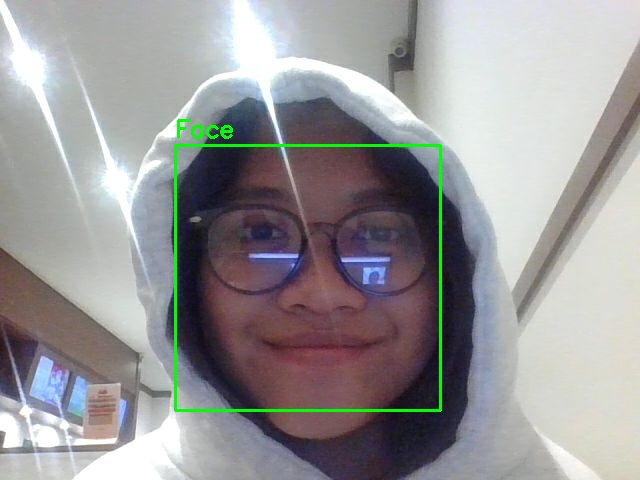

Face tracking berhenti.


In [ ]:
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io
import json
import time

# -----------------------
# helper: convert JS dataURL -> OpenCV image (BGR)
def js_to_image(js_reply):
    if not js_reply:
        return None
    image_bytes = b64decode(js_reply.split(',')[1])
    jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
    img = cv2.imdecode(jpg_as_np, flags=1)
    return img

# helper: convert RGBA numpy overlay -> dataURL (png)
def bbox_to_bytes(bbox_array):
    bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')
    iobuf = io.BytesIO()
    bbox_PIL.save(iobuf, format='png')
    bbox_bytes = 'data:image/png;base64,{}'.format(
        (str(b64encode(iobuf.getvalue()), 'utf-8'))
    )
    return bbox_bytes

# helper: tampilkan hasil capture di output cell
def show_capture_in_output(img, faces):
    img_out = img.copy()
    for (x, y, w, h) in faces:
        cv2.rectangle(img_out, (x, y), (x+w, y+h), (0, 255, 0), 2)
        cv2.putText(img_out, 'Face', (x, y-8), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0,255,0), 2)

    # konversi ke format tampilan
    _, buffer = cv2.imencode('.jpg', img_out)
    img_display = Image(data=buffer.tobytes())
    display(img_display)

# -----------------------
# load Haar cascade
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades +
                                     'haarcascade_frontalface_default.xml')

# -----------------------
# JavaScript tampilan kamera + tombol Capture
JS = Javascript('''
var video; var div=null; var stream; var captureCanvas; var imgElement;
var pendingResolve = null; var shutdown = false; var captureFlag = false;

function removeDom() {
  try { stream.getVideoTracks()[0].stop(); } catch(e){}
  try { video.remove(); } catch(e){}
  try { div.remove(); } catch(e){}
  video=null; div=null; stream=null; imgElement=null; captureCanvas=null;
}

function onAnimationFrame() {
  if (!shutdown) window.requestAnimationFrame(onAnimationFrame);
  if (pendingResolve) {
    var result = "";
    if (!shutdown) {
      var ctx = captureCanvas.getContext('2d');
      ctx.drawImage(video, 0, 0, captureCanvas.width, captureCanvas.height);
      result = captureCanvas.toDataURL('image/jpeg', 0.8);
    }
    var lp = pendingResolve;
    pendingResolve = null;
    lp(result);
  }
}

async function createDom() {
  if (div !== null) return stream;
  div = document.createElement('div');
  div.style.position = 'relative';
  div.style.width = '640px';
  div.style.height = '520px';
  div.style.border = '2px solid #333';
  div.style.margin = '8px 0';
  document.body.appendChild(div);

  // video element
  video = document.createElement('video');
  video.style.width = '640px';
  video.style.height = '480px';
  video.style.objectFit = 'cover';
  video.setAttribute('playsinline','');
  div.appendChild(video);

  // overlay deteksi wajah
  imgElement = document.createElement('img');
  imgElement.style.position = 'absolute';
  imgElement.style.top = '0px';
  imgElement.style.left = '0px';
  imgElement.style.width = '640px';
  imgElement.style.height = '480px';
  imgElement.style.pointerEvents = 'none';
  imgElement.style.zIndex = 2;
  div.appendChild(imgElement);

  // tombol Capture
  var btn = document.createElement('button');
  btn.innerHTML = "📸 Capture";
  btn.style.marginTop = "5px";
  btn.onclick = function(){ captureFlag = true; };
  div.appendChild(btn);

  // teks info
  const info = document.createElement('div');
  info.innerHTML = '<b style="color:red;">Klik video untuk berhenti</b>';
  div.appendChild(info);

  stream = await navigator.mediaDevices.getUserMedia({video: {width:640, height:480}});
  video.srcObject = stream;
  await video.play();

  captureCanvas = document.createElement('canvas');
  captureCanvas.width = 640;
  captureCanvas.height = 480;
  window.requestAnimationFrame(onAnimationFrame);

  video.onclick = function(){ shutdown = true; removeDom(); };

  return stream;
}

async function stream_frame(label, imgData) {
  if (shutdown) { removeDom(); shutdown=false; return ''; }
  await createDom();
  if (imgData != "") imgElement.src = imgData;
  else imgElement.src = "";

  var result = await new Promise(function(resolve, reject) { pendingResolve = resolve; });
  let flag = captureFlag;
  captureFlag = false; // reset
  shutdown = false;
  return {'img': result, 'capture': flag};
}
''')
display(JS)

# -----------------------
# Main loop
print(">>> START: Klik Allow kamera, klik '📸 Capture' untuk ambil foto, klik video untuk berhenti.")
time.sleep(0.5)

label_html = 'Tracking...'
bbox = ''

try:
  while True:
    js_code = f"stream_frame({json.dumps(label_html)}, {json.dumps(bbox)})"
    js_reply = eval_js(js_code)
    if not js_reply:
        break

    img = js_to_image(js_reply.get("img", ""))
    if img is None:
        time.sleep(0.05)
        continue

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.15, minNeighbors=6, minSize=(50,50))

    # buat overlay RGBA
    h, w = img.shape[:2]
    bbox_array = np.zeros((h, w, 4), dtype=np.uint8)
    for (x, y, fw, fh) in faces:
        cv2.rectangle(bbox_array, (x, y), (x+fw, y+fh), (255,120,0,255), 3)
        cv2.putText(bbox_array, "Face", (x, y-8),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255,255,255,255), 2)

    bbox_bytes = bbox_to_bytes(bbox_array)
    bbox = bbox_bytes

    # jika tombol Capture ditekan → tampilkan hasil di output
    if js_reply.get("capture", False):
        show_capture_in_output(img, faces)

    time.sleep(0.03)

except Exception as e:
  print("Stopped. Exception:", e)

print("Face tracking berhenti.")

<IPython.core.display.Javascript object>

>>> START: Kamera aktif. Klik '📸 Capture' untuk menampilkan hasil. Klik video untuk berhenti.


/tmp/ipython-input-3345681054.py:29: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')


📸 Hasil capture:


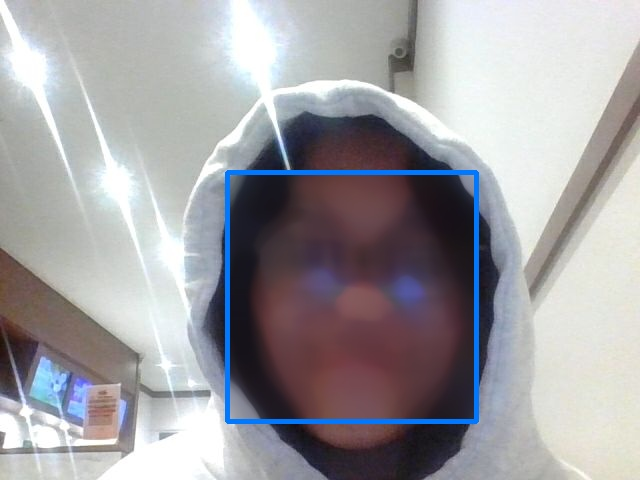

Face tracking berhenti.


In [ ]:
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io
import json
import time

# -----------------------
# helper: convert JS dataURL -> OpenCV image (BGR)
def js_to_image(js_reply):
    if not js_reply:
        return None
    image_bytes = b64decode(js_reply.split(',')[1])
    jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
    img = cv2.imdecode(jpg_as_np, flags=1)
    return img

# helper: convert numpy image -> displayable
def show_image(img):
    _, im_arr = cv2.imencode('.jpg', img)
    im_bytes = im_arr.tobytes()
    display(Image(data=im_bytes))

# helper: convert RGBA numpy overlay -> dataURL (png)
def bbox_to_bytes(bbox_array):
    bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')
    iobuf = io.BytesIO()
    bbox_PIL.save(iobuf, format='png')
    bbox_bytes = 'data:image/png;base64,{}'.format((str(b64encode(iobuf.getvalue()), 'utf-8')))
    return bbox_bytes

# load Haar cascade
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# -----------------------
# JavaScript: video stream + overlay + tombol Capture
JS = Javascript('''
var video; var div=null; var stream; var captureCanvas; var imgElement; var captureButton;
var pendingResolve = null; var shutdown = false; var doCapture = false;

function removeDom() {
  try { stream.getVideoTracks()[0].stop(); } catch(e){}
  try { video.remove(); } catch(e){}
  try { div.remove(); } catch(e){}
  video=null; div=null; stream=null; imgElement=null; captureCanvas=null;
}

function onAnimationFrame() {
  if (!shutdown) window.requestAnimationFrame(onAnimationFrame);
  if (pendingResolve) {
    var result = "";
    if (!shutdown) {
      var ctx = captureCanvas.getContext('2d');
      ctx.drawImage(video, 0, 0, captureCanvas.width, captureCanvas.height);
      result = captureCanvas.toDataURL('image/jpeg', 0.8);
    }
    var lp = pendingResolve;
    pendingResolve = null;
    lp(result);
  }
}

async function createDom() {
  if (div !== null) return stream;
  div = document.createElement('div');
  div.style.position = 'relative';
  div.style.width = '640px';
  div.style.height = '520px';
  div.style.border = '2px solid #333';
  div.style.margin = '8px 0';
  document.body.appendChild(div);

  video = document.createElement('video');
  video.style.width = '640px';
  video.style.height = '480px';
  video.setAttribute('playsinline','');
  div.appendChild(video);

  imgElement = document.createElement('img');
  imgElement.style.position = 'absolute';
  imgElement.style.top = '0px';
  imgElement.style.left = '0px';
  imgElement.style.width = '640px';
  imgElement.style.height = '480px';
  imgElement.style.pointerEvents = 'none';
  imgElement.style.zIndex = 2;
  div.appendChild(imgElement);

  // Tombol capture
  captureButton = document.createElement('button');
  captureButton.innerHTML = '📸 Capture';
  captureButton.style.position = 'absolute';
  captureButton.style.bottom = '5px';
  captureButton.style.left = '5px';
  captureButton.style.padding = '6px 12px';
  captureButton.style.fontSize = '16px';
  captureButton.onclick = () => { doCapture = true; };
  div.appendChild(captureButton);

  // Info teks
  const info = document.createElement('div');
  info.innerHTML = '<b style="color:red;">Klik video untuk berhenti</b>';
  info.style.position = 'absolute';
  info.style.bottom = '5px';
  info.style.right = '10px';
  div.appendChild(info);

  stream = await navigator.mediaDevices.getUserMedia({video: {width:640, height:480}});
  video.srcObject = stream;
  await video.play();

  captureCanvas = document.createElement('canvas');
  captureCanvas.width = 640;
  captureCanvas.height = 480;
  window.requestAnimationFrame(onAnimationFrame);

  video.onclick = function(){ shutdown = true; removeDom(); };

  return stream;
}

async function stream_frame(label, imgData) {
  if (shutdown) { removeDom(); shutdown=false; return ''; }
  await createDom();
  if (imgData != "") imgElement.src = imgData;
  else imgElement.src = "";
  var result = await new Promise(function(resolve, reject) { pendingResolve = resolve; });
  var captured = doCapture;
  doCapture = false;
  return {'img': result, 'capture': captured};
}
''')
display(JS)

# -----------------------
print(">>> START: Kamera aktif. Klik '📸 Capture' untuk menampilkan hasil. Klik video untuk berhenti.")
time.sleep(0.5)

label_html = 'Tracking...'
bbox = ''   # overlay awal kosong
captured_frame = None

try:
  while True:
    js_code = "stream_frame({}, {})".format(json.dumps(label_html), json.dumps(bbox))
    js_reply = eval_js(js_code)

    if not js_reply:
      break

    img = js_to_image(js_reply.get("img", ""))
    if img is None:
      time.sleep(0.05)
      continue

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.15, minNeighbors=6, minSize=(50,50))

    output_img = img.copy()
    for (x, y, fw, fh) in faces:
        face_region = output_img[y:y+fh, x:x+fw]
        face_region = cv2.medianBlur(face_region, 35)
        output_img[y:y+fh, x:x+fw] = face_region
        cv2.rectangle(output_img, (x, y), (x+fw, y+fh), (255, 120, 0), 3)

    # tampilkan overlay di JS
    output_rgba = cv2.cvtColor(output_img, cv2.COLOR_BGR2RGBA)
    bbox_bytes = bbox_to_bytes(output_rgba)
    bbox = bbox_bytes

    # jika tombol Capture ditekan, tampilkan hasil di output Colab
    if js_reply.get("capture", False):
        print("📸 Hasil capture:")
        show_image(output_img)

    time.sleep(0.02)

except Exception as e:
  print("Stopped. Exception:", e)

print("Face tracking berhenti.")


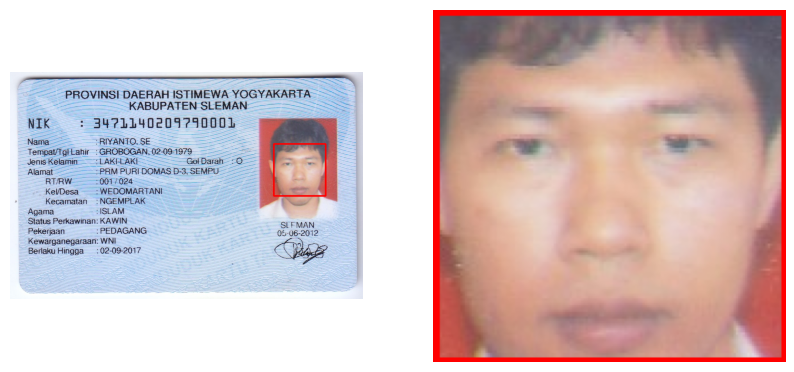

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Path gambar KTM
img_path = '/content/drive/MyDrive/PCVK/ktp.png'

# Load gambar
img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Load face detector
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Deteksi wajah
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.15, minNeighbors=5, minSize=(30, 30))

# Gambar kotak dan tampilkan hasil crop
for (x, y, w, h) in faces:
    # Gambar kotak di wajah
    cv2.rectangle(img_rgb, (x, y), (x+w, y+h), (255, 0, 0), 3)

    # Crop bagian wajah
    face_crop = img_rgb[y:y+h, x:x+w]

    # Tampilkan hasil
    plt.figure(figsize=(10,5))

    # Gambar KTM dengan kotak wajah
    plt.subplot(1,2,1)
    plt.imshow(img_rgb)
    plt.axis('off')

    # Gambar wajah hasil crop
    plt.subplot(1,2,2)
    plt.imshow(face_crop)
    plt.axis('off')

    plt.show()


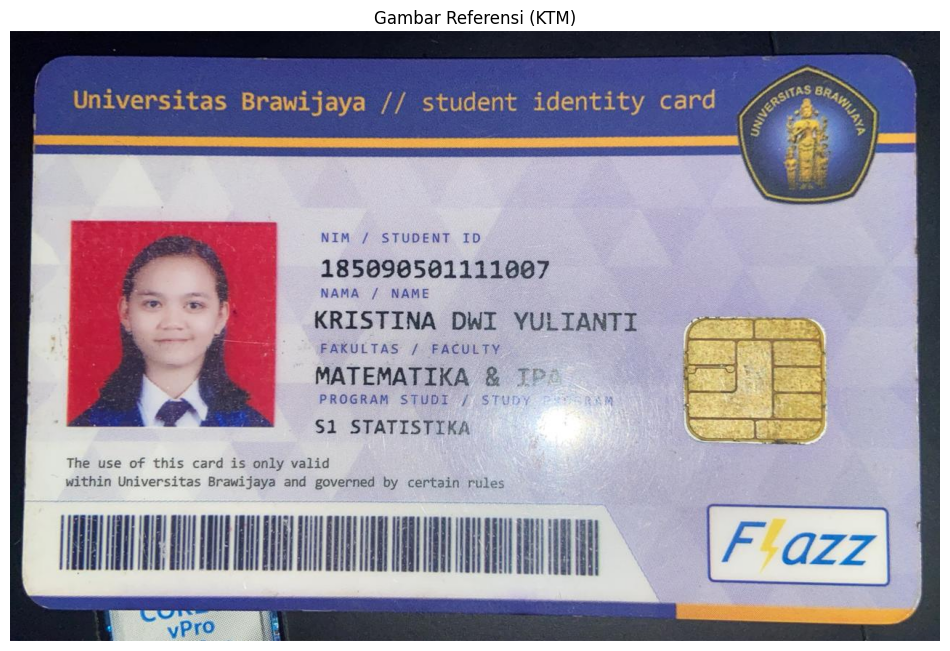

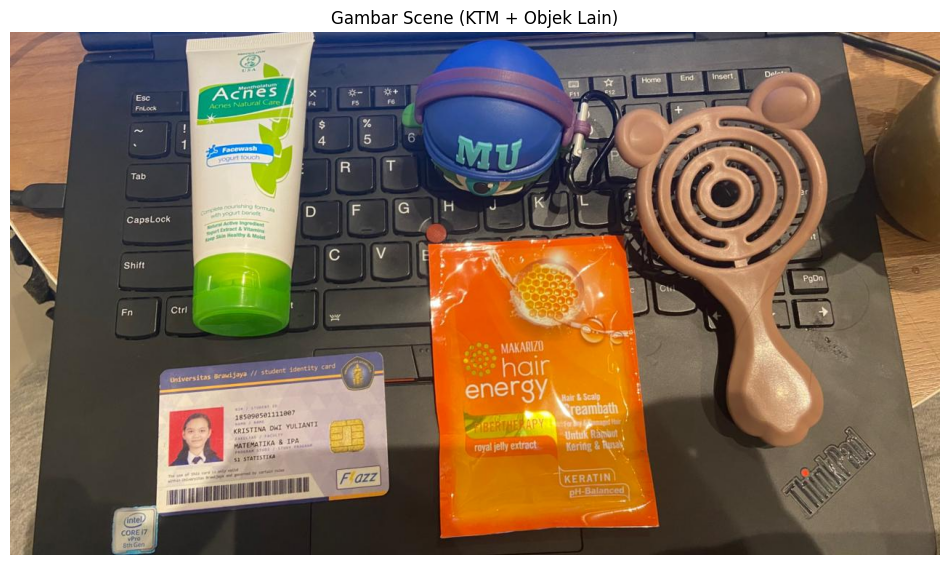

Jumlah total matches: 85
Rata-rata jarak 20 match terbaik: 56.45


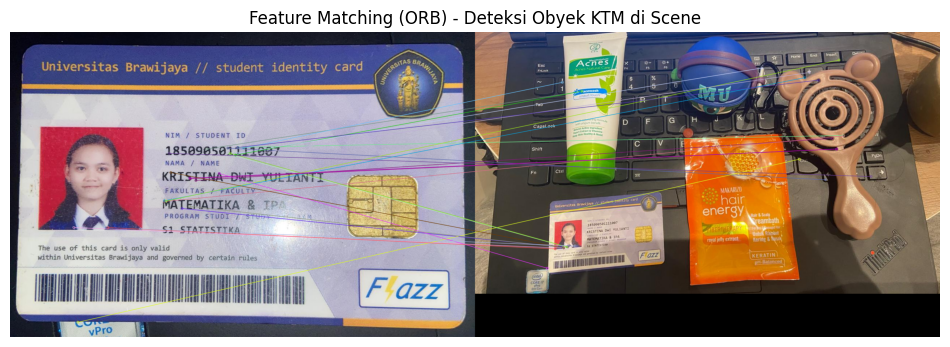

In [ ]:
import cv2
import matplotlib.pyplot as plt

def display(img, title=None):
    plt.figure(figsize=(12, 8))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb)
    if title:
        plt.title(title)
    plt.axis('off')
    plt.show()

# 1. Membaca citra referensi (KTM) dan citra scene (BERWARNA)
img_ktm_color = cv2.imread('/content/drive/MyDrive/PCVK/ktm.jpeg', cv2.IMREAD_COLOR)
img_scene_color = cv2.imread('/content/drive/MyDrive/PCVK/ktm_scene.jpeg', cv2.IMREAD_COLOR)

# 2. Konversi ke grayscale untuk deteksi fitur (ORB pakai grayscale)
img_ktm_gray = cv2.cvtColor(img_ktm_color, cv2.COLOR_BGR2GRAY)
img_scene_gray = cv2.cvtColor(img_scene_color, cv2.COLOR_BGR2GRAY)

# 3. Tampilkan kedua citra asli (berwarna)
display(img_ktm_color, title='Gambar Referensi (KTM)')
display(img_scene_color, title='Gambar Scene (KTM + Objek Lain)')

# 4. Inisialisasi ORB
orb = cv2.ORB_create()

# 5. Deteksi keypoints dan descriptor (pakai grayscale)
kp1, des1 = orb.detectAndCompute(img_ktm_gray, None)
kp2, des2 = orb.detectAndCompute(img_scene_gray, None)

# 6. Pencocokan fitur (Brute-Force dengan Hamming)
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)

# 7. Info hasil
print("Jumlah total matches:", len(matches))
distances = [m.distance for m in matches[:20]]
print("Rata-rata jarak 20 match terbaik:", sum(distances) / len(distances))

# 8. Visualisasi hasil matching pada gambar BERWARNA
result = cv2.drawMatches(
    img_ktm_color, kp1, img_scene_color, kp2, matches[:25], None,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)

# 9. Tampilkan hasil akhir
display(result, title='Feature Matching (ORB) - Deteksi Obyek KTM di Scene')


# Tugas Praktikum Tambahan

In [ ]:
import os

base_dir = "/content/drive/MyDrive/KTM/dataset/training"
os.makedirs(base_dir, exist_ok=True)

for i in range(8):
    os.makedirs(os.path.join(base_dir, str(i)), exist_ok=True)

print("")
!tree /content/dataset -L 2



/bin/bash: line 1: tree: command not found


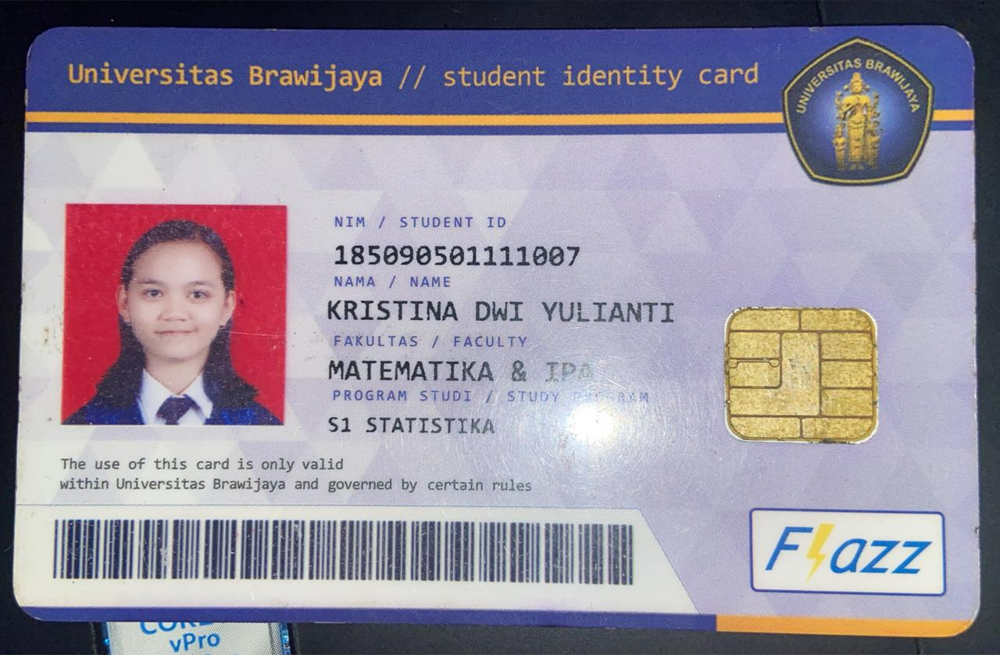

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

img_path = "/content/drive/MyDrive/PCVK/ktm.jpeg"
img = cv2.imread(img_path)
cv2_imshow(img)

In [ ]:
!pip install tensorflow

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
import numpy as np
import os

# konfigurasi augmentasi
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    brightness_range=[0.8, 1.2],
    shear_range=10,
    fill_mode='nearest'
)

base_dir = "/content/drive/MyDrive/KTM/dataset/training"

for label in os.listdir(base_dir):
    folder = os.path.join(base_dir, label)
    if not os.path.isdir(folder):
        continue

    for img_name in os.listdir(folder):
        img_path = os.path.join(folder, img_name)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            continue

        img = cv2.resize(img, (100, 100))
        img = img.reshape((1,) + img.shape + (1,))  # ubah ke (1, 100, 100, 1)

        # buat 10 variasi per gambar
        i = 0
        for batch in datagen.flow(img, batch_size=1,
                                  save_to_dir=folder,
                                  save_prefix=f"aug_{label}",
                                  save_format='png'):
            i += 1
            if i > 10:
                break
print("Augmentasi selesai! Dataset kamu sekarang jauh lebih besar.")

Augmentasi selesai! Dataset kamu sekarang jauh lebih besar.


In [ ]:
import os
from tqdm import tqdm
import cv2
import random
import numpy as np
import pickle

DATADIR = "/content/drive/MyDrive/KTM/dataset/training"
width, height = 100, 100

dirs = sorted([d for d in os.listdir(DATADIR) if os.path.isdir(os.path.join(DATADIR, d))])
print("Labels found:", dirs)

training_data = []
for char_name in dirs:
    class_number = dirs.index(char_name)
    path = os.path.join(DATADIR, char_name)
    for img_name in tqdm(os.listdir(path), desc=f"Processing {char_name}"):
        img_path = os.path.join(path, img_name)
        try:
            # baca grayscale biar channel = 1
            img_array = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            if img_array is None:
                continue

            # resize ke ukuran seragam
            new_array = cv2.resize(img_array, (width, height))
            training_data.append([new_array, class_number])
        except Exception as e:
            print("Error:", img_path, e)
            continue

# acak urutan data
random.shuffle(training_data)

# pisahkan fitur (X) dan label (Y)
X, Y = [], []
for feature, label in training_data:
    X.append(feature)
    Y.append(label)

X = np.array(X).reshape(-1, width, height, 1).astype('float32')
Y = np.array(Y, dtype=np.int32)

with open("X.pickle", "wb") as f:
    pickle.dump(X, f)

with open("Y.pickle", "wb") as f:
    pickle.dump(Y, f)

print("   Saved X.pickle and Y.pickle.")
print("   X shape:", X.shape)
print("   Y shape:", Y.shape)

Labels found: ['0', '1', '2', '3', '4', '5', '6', '7']


Processing 0: 0it [00:00, ?it/s]
Processing 1: 0it [00:00, ?it/s]
Processing 2: 0it [00:00, ?it/s]
Processing 3: 0it [00:00, ?it/s]
Processing 4: 0it [00:00, ?it/s]
Processing 5: 0it [00:00, ?it/s]
Processing 6: 0it [00:00, ?it/s]
Processing 7: 0it [00:00, ?it/s]

   Saved X.pickle and Y.pickle.
   X shape: (0, 100, 100, 1)
   Y shape: (0,)
